<a href="https://colab.research.google.com/github/sumanthpavan54/Telecom_Churn/blob/main/telecom_churn_final.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [104]:
#Loading all the necessary libraries
import pandas as pd
import matplotlib.pyplot as plt
import re
import time
import warnings
import numpy as np
from nltk.corpus import stopwords
from sklearn.decomposition import TruncatedSVD
from sklearn.preprocessing import normalize
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.manifold import TSNE
import seaborn as sns
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import confusion_matrix
#from sklearn.metrics.classification import accuracy_score, log_loss
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.linear_model import SGDClassifier
from imblearn.over_sampling import SMOTE
from collections import Counter
from scipy.sparse import hstack
from sklearn.multiclass import OneVsRestClassifier
from sklearn.svm import SVC
from collections import Counter, defaultdict
from sklearn.calibration import CalibratedClassifierCV
from sklearn.naive_bayes import MultinomialNB
from sklearn.naive_bayes import GaussianNB
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV
import math
from sklearn.metrics import normalized_mutual_info_score
from sklearn.ensemble import RandomForestClassifier
warnings.filterwarnings("ignore")

from mlxtend.classifier import StackingClassifier

from sklearn import model_selection
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report

In [105]:
test = pd.read_csv("/content/churn-bigml-20.csv")
train = pd.read_csv("/content/churn-bigml-80.csv")
df = pd.concat([train, test],ignore_index=True)
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,OH,107,415,No,Yes,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,NJ,137,415,No,No,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,OH,84,408,Yes,No,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,OK,75,415,Yes,No,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


# **Performing Analysis to get more insights of dataframe**

In [106]:
df.shape#gives shape of the data with rows and columns size in the form of tuple

(3333, 20)

In [107]:
df.describe()#

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
count,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000,3333.000000
mean,101.064806,437.182418,8.099010,179.775098,100.435644,30.562307,200.980348,100.114311,17.083540,200.872037,100.107711,9.039325,10.237294,4.479448,2.764581,1.562856
std,39.822106,42.371290,13.688365,54.467389,20.069084,9.259435,50.713844,19.922625,4.310668,50.573847,19.568609,2.275873,2.791840,2.461214,0.753773,1.315491
min,1.000000,408.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,23.200000,33.000000,1.040000,0.000000,0.000000,0.000000,0.000000
25%,74.000000,408.000000,0.000000,143.700000,87.000000,24.430000,166.600000,87.000000,14.160000,167.000000,87.000000,7.520000,8.500000,3.000000,2.300000,1.000000
50%,101.000000,415.000000,0.000000,179.400000,101.000000,30.500000,201.400000,100.000000,17.120000,201.200000,100.000000,9.050000,10.300000,4.000000,2.780000,1.000000
75%,127.000000,510.000000,20.000000,216.400000,114.000000,36.790000,235.300000,114.000000,20.000000,235.300000,113.000000,10.590000,12.100000,6.000000,3.270000,2.000000
max,243.000000,510.000000,51.000000,350.800000,165.000000,59.640000,363.700000,170.000000,30.910000,395.000000,175.000000,17.770000,20.000000,20.000000,5.400000,9.000000


In [108]:
df['Churn'].value_counts()#returns the frequency of the each value present in the given series

False    2850
True      483
Name: Churn, dtype: int64

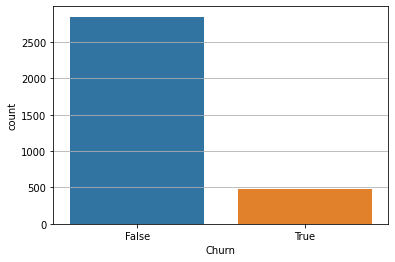

In [109]:
plt.grid()
sns.countplot(df['Churn'])

In [110]:
for i in df['Churn'].value_counts():
    print((i/len(df['Churn'])*100))

85.5085508550855
14.491449144914492


# Observation:

We have 85.5% of non-churn customers belongs to majority class and just 14.5% of churn customers belongs to minority class. We can conclude the dataset is imbalance.

# EDA

In [111]:
#finding the null values
df.isnull().sum(axis=0)#performs column wise sum and returns the sum and each column name

State                     0
Account length            0
Area code                 0
International plan        0
Voice mail plan           0
Number vmail messages     0
Total day minutes         0
Total day calls           0
Total day charge          0
Total eve minutes         0
Total eve calls           0
Total eve charge          0
Total night minutes       0
Total night calls         0
Total night charge        0
Total intl minutes        0
Total intl calls          0
Total intl charge         0
Customer service calls    0
Churn                     0
dtype: int64

**Observation:**

Null values are not present accross all the columns

In [112]:
#finding the duplicates of rows

df[df.duplicated()]#df.duplicated() returns the boolean values where data is duplicated 
#df[df.duplicated()] gives the rows where the boolean is true
#for more info on duplicated() please refer below:
#https://www.geeksforgeeks.org/find-duplicate-rows-in-a-dataframe-based-on-all-or-selected-columns/

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn


**Observation**

We do not have any duplicated rows

# Uni-Variate Analysis

**Performing uni-variate analysis on numerical data**

In [113]:
df_numerical = df.select_dtypes(include=['int64','float64'])
df_numerical.head()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls
0,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1
1,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1
2,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0
3,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2
4,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3


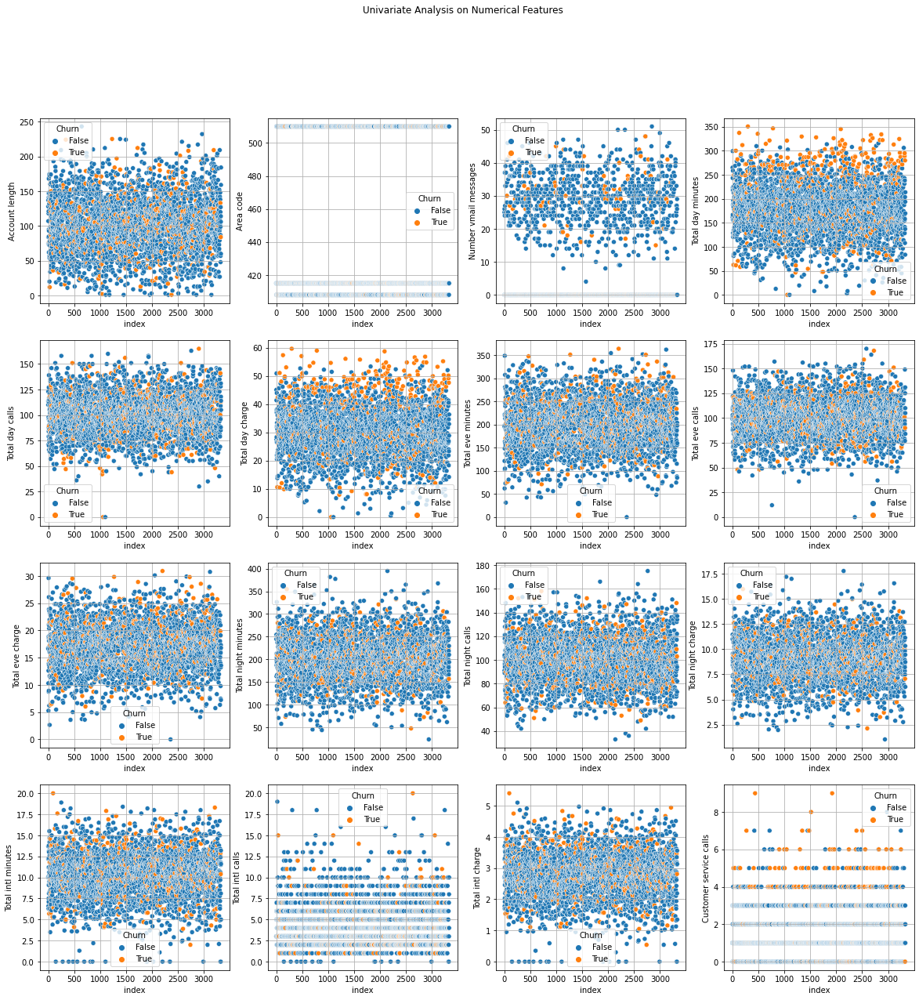

In [114]:
l=[i for i in df_numerical.columns]
fig, axes = plt.subplots(4, 4, figsize=(20, 20))
num=0
fig.suptitle("Univariate Analysis on Numerical Features")
for i in range(4):
    for j in range(4):
        sns.scatterplot(ax=axes[i,j],x=df_numerical.reset_index()['index'],y=df_numerical[l[num]],hue=df['Churn'])
        axes[i,j].grid()
        num=num+1
plt.show()

#for more information on subplots please refer:
#https://dev.to/thalesbruno/subplotting-with-matplotlib-and-seaborn-5ei8


    

**Observation:**

We can notice Customer service calls, Total day charge, Total day minutes features are seperable wrt churn label hence we will explore more on these



**Exploring on Customer service calls**

In [115]:
df['Customer service calls'].describe()


count    3333.000000
mean        1.562856
std         1.315491
min         0.000000
25%         1.000000
50%         1.000000
75%         2.000000
max         9.000000
Name: Customer service calls, dtype: float64

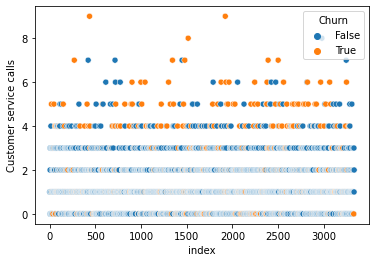

In [116]:
sns.scatterplot(x=df.reset_index()['index'],y=df['Customer service calls'],hue=df['Churn'])

**Observation:**

We can notice there is a seperation of churn and non-churn customers starting between 3&4 and ends at 9

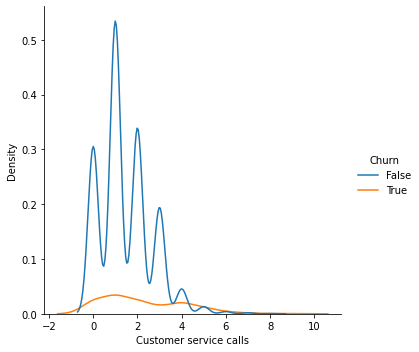

In [117]:
sns.displot(x=df['Customer service calls'],hue=df['Churn'],kind='kde')

**Observation:**

We can see a lot of spikes and it is difficult to distingush between churn and non-churn customers

In [118]:
#Finding wether the Customer service calls effected the customers being churn or not
cus_call = df[df['Customer service calls']>=3]['Churn'].value_counts().to_dict()
cus_call

{False: 514, True: 182}

In [119]:
churn_dict=df['Churn'].value_counts().to_dict()

In [120]:
print("{}% of churn customers are having customer service calls>=3".format(np.round((cus_call[True]/churn_dict[True])*100,2)))
print("{}% of non-churn customers are having customer service calls>=3".format(np.round((cus_call[False]/churn_dict[False])*100,2)))

37.68% of churn customers are having customer service calls>=3
18.04% of non-churn customers are having customer service calls>=3


**Exploring on Total day charge**

In [121]:
df['Total day charge'].describe()

count    3333.000000
mean       30.562307
std         9.259435
min         0.000000
25%        24.430000
50%        30.500000
75%        36.790000
max        59.640000
Name: Total day charge, dtype: float64

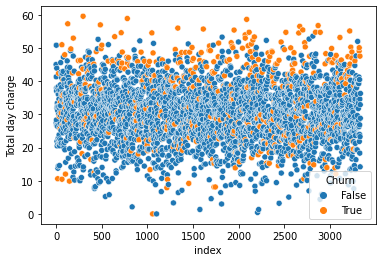

In [122]:
sns.scatterplot(x=df.reset_index()['index'],y=df['Total day charge'],hue=df['Churn'])

Observation:

We can notice that churn customers seperation starts from 40-50 and ends at 60. 

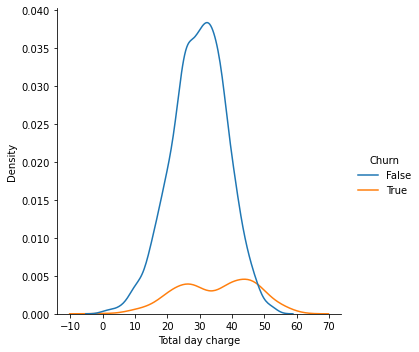

In [123]:
sns.displot(x=df['Total day charge'],hue=df['Churn'],kind='kde')

**Observation:**

After Total day charge >=40 we can see there is big sudden drop of non-churn customers

In [124]:
tot_day_charge_dict = df[df['Total day charge']>=40]['Churn'].value_counts().to_dict()
tot_day_charge_dict

{False: 318, True: 198}

In [125]:
print("{}% of churn customers are having Total day charge>=40".format(np.round((tot_day_charge_dict[True]/churn_dict[True])*100,2)))
print("{}% of non-churn customers are having Total day charge>=40".format(np.round((tot_day_charge_dict[False]/churn_dict[False])*100,2)))

40.99% of churn customers are having Total day charge>=40
11.16% of non-churn customers are having Total day charge>=40


**Exploring on Total day minutes**

In [126]:
df['Total day minutes'].describe()

count    3333.000000
mean      179.775098
std        54.467389
min         0.000000
25%       143.700000
50%       179.400000
75%       216.400000
max       350.800000
Name: Total day minutes, dtype: float64

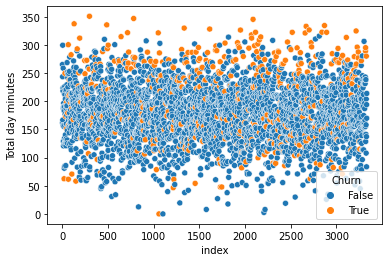

In [127]:
sns.scatterplot(x=df.reset_index()['index'],y=df['Total day minutes'],hue=df['Churn'])

**Observation:**

We can see there is seperation of churn and non-churn customers starts between 200&250 and ends at 350


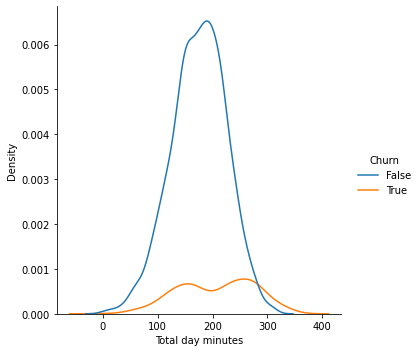

In [128]:
sns.displot(x=df['Total day minutes'],hue=df['Churn'],kind='kde')

**Observation:**

We can see there is a sudden drop of non-churn customers after 230


In [129]:
tot_day_mts_dict = df[df['Total day minutes']>=230]['Churn'].value_counts()

tot_day_mts_dict

False    386
True     207
Name: Churn, dtype: int64

In [130]:
print("{}% of churn customers are having tot_day_minutes>=230".format(np.round((tot_day_mts_dict[True]/churn_dict[True])*100,2)))
print("{}% of non-churn customers are having tot_day_minutes>=230".format(np.round((tot_day_mts_dict[False]/churn_dict[False])*100,2)))

42.86% of churn customers are having tot_day_minutes>=230
13.54% of non-churn customers are having tot_day_minutes>=230


**Performing uni-variate analysis on categorical features**

In [131]:
#selecting the datafram with categorical features only
df_categorical = df.select_dtypes(include=['object'])
df_categorical.head()

,State,International plan,Voice mail plan
0,KS,No,Yes
1,OH,No,Yes
2,NJ,No,No
3,OH,Yes,No
4,OK,Yes,No


**Exploring on State Feature**

In [132]:
print(len(df['State'].value_counts()))
states_unique_count = df['State'].value_counts()
state_percnt = states_unique_count.values/len(df['State'])
state_percnt

51


array([0.03180318, 0.02520252, 0.02490249, 0.0240024 , 0.02340234,
       0.02340234, 0.02340234, 0.02310231, 0.02310231, 0.02220222,
       0.02190219, 0.02190219, 0.02190219, 0.02160216, 0.02160216,
       0.02130213, 0.0210021 , 0.0210021 , 0.02040204, 0.02040204,
       0.02040204, 0.01980198, 0.01980198, 0.01980198, 0.01950195,
       0.01950195, 0.01950195, 0.01920192, 0.01890189, 0.01890189,
       0.01860186, 0.01860186, 0.01860186, 0.01830183, 0.01830183,
       0.01830183, 0.0180018 , 0.0180018 , 0.01770177, 0.01740174,
       0.01680168, 0.01650165, 0.01620162, 0.01620162, 0.01590159,
       0.01590159, 0.01560156, 0.01530153, 0.01350135, 0.01320132,
       0.01020102])

Text(0, 0.5, 'Percenatge occupies by each state')

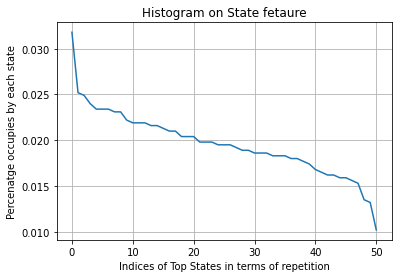

In [133]:
#plotting histogram in terms of percentage occupies by each State
plt.plot(state_percnt)
plt.title("Histogram on State fetaure")
plt.grid()
plt.xlabel("Indices of Top States in terms of repetition")
plt.ylabel("Percenatge occupies by each state")


In [134]:
state_cum_sum = []
a=0
for i in state_percnt:
    a=a+i
    state_cum_sum.append(a)
print(state_cum_sum)

[0.0318031803180318, 0.05700570057005701, 0.0819081908190819, 0.10591059105910591, 0.12931293129312932, 0.15271527152715272, 0.17611761176117613, 0.19921992199219923, 0.22232223222322234, 0.24452445244524454, 0.26642664266426647, 0.28832883288328837, 0.31023102310231027, 0.3318331833183319, 0.3534353435343535, 0.3747374737473748, 0.39573957395739584, 0.41674167416741686, 0.4371437143714373, 0.4575457545754577, 0.47794779477947813, 0.49774977497749795, 0.5175517551755178, 0.5373537353735376, 0.5568556855685571, 0.5763576357635767, 0.5958595859585962, 0.6150615061506154, 0.6339633963396343, 0.6528652865286532, 0.6714671467146718, 0.6900690069006904, 0.708670867086709, 0.7269726972697274, 0.7452745274527457, 0.763576357635764, 0.781578157815782, 0.7995799579958, 0.8172817281728176, 0.834683468346835, 0.8514851485148518, 0.8679867986798683, 0.8841884188418845, 0.9003900390039007, 0.9162916291629166, 0.9321932193219326, 0.9477947794779481, 0.9630963096309634, 0.9765976597659769, 0.989798979

Text(0, 0.5, 'Cummulative sum of percentages of each state')

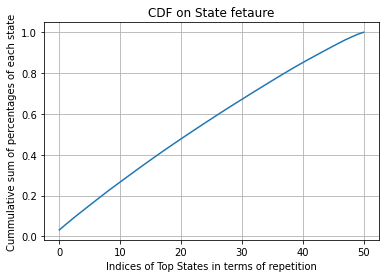

In [135]:
#plotting cdf on States feature
plt.plot(state_cum_sum)
plt.title("CDF on State fetaure")
plt.grid()
plt.xlabel("Indices of Top States in terms of repetition")
plt.ylabel("Cummulative sum of percentages of each state")

**Observation:**

we can see from the cdf that 90% of states are from first 40 states out of 51 unique states. Hence all the states almost equally contributes in terms of frequency of occurences

In [136]:
#finding the states which are part of churn but not on non-churn
states_for_churn_cust = df[df['Churn']==True]['State'].value_counts()#generating the churn states frquencies
churn_states=set()#creating empty set
for key,value in states_for_churn_cust.to_dict().items():
    churn_states.add(key)#adding each churn state to set
states_for_churn_cust = df[df['Churn']==False]['State'].value_counts()#generating the non-churn states frequencies
non_churn_states=set()
for key,value in states_for_churn_cust.to_dict().items():
    non_churn_states.add(key)#adding each non-churn state to set
print(churn_states)
print(non_churn_states)
print("{} these are states which are part of churn but not part of non-churn".format(churn_states-non_churn_states))#A-B does the set differnce operation it will print non-common values of only A

{'CA', 'OK', 'MD', 'KY', 'NV', 'LA', 'MS', 'AZ', 'VT', 'TX', 'SD', 'CT', 'IA', 'NY', 'WA', 'FL', 'MI', 'RI', 'PA', 'NC', 'MO', 'IN', 'DE', 'TN', 'WI', 'ME', 'MT', 'UT', 'WY', 'IL', 'VA', 'GA', 'AL', 'NE', 'NH', 'OH', 'AK', 'ND', 'DC', 'NJ', 'OR', 'ID', 'WV', 'HI', 'AR', 'NM', 'MA', 'SC', 'KS', 'CO', 'MN'}
{'OK', 'CA', 'MD', 'KY', 'NV', 'LA', 'MS', 'AZ', 'VT', 'TX', 'SD', 'CT', 'IA', 'NY', 'FL', 'WA', 'RI', 'MI', 'PA', 'NC', 'MO', 'IN', 'DE', 'TN', 'WI', 'ME', 'MT', 'UT', 'WY', 'IL', 'VA', 'GA', 'AL', 'NE', 'NH', 'OH', 'AK', 'ND', 'DC', 'NJ', 'OR', 'ID', 'WV', 'HI', 'AR', 'NM', 'MA', 'SC', 'KS', 'CO', 'MN'}
set() these are states which are part of churn but not part of non-churn


**Observation:**

By looking into above set difference the customers from all the states are being churn and non-churn.Since couldn't able to seperate the churn and non-churn customers

**Exploring on International Plan**

In [137]:
df['International plan'].value_counts()

No     3010
Yes     323
Name: International plan, dtype: int64

In [138]:
df["International plan"].value_counts()/len(df['International plan'])

No     0.90309
Yes    0.09691
Name: International plan, dtype: float64

**Observation:**

There are less customers who are having international plan and they contribute just 10% of total customers in the dataframe and 90% of customers doesn't have international plan.


In [139]:
churn_inter_plan = df[df['Churn']==True]['International plan'].value_counts()
print(churn_inter_plan)

print("International Plan details for churn customers")

print((churn_inter_plan/(churn_dict[True])*100))


No     346
Yes    137
Name: International plan, dtype: int64
International Plan details for churn customers
No     71.635611
Yes    28.364389
Name: International plan, dtype: float64


**Observation:**

70% of churn customers doesn't have international plan

In [140]:
non_churn_inter_plan = df[df['Churn']==False]['International plan'].value_counts()

print(non_churn_inter_plan)

print("International Plan details for non-churn customers")

print((non_churn_inter_plan/(churn_dict[False])*100))

No     2664
Yes     186
Name: International plan, dtype: int64
International Plan details for non-churn customers
No     93.473684
Yes     6.526316
Name: International plan, dtype: float64


**Observation:**

Only 6% of non-churn customers have international plan and 94% of non-churn doesn't have international plan


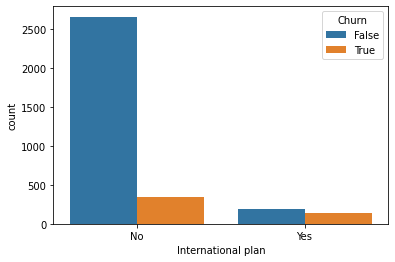

In [141]:
sns.countplot(x=df['International plan'],hue=df['Churn'])

**Exploring on voice mail plan**

In [142]:
df['Voice mail plan'].value_counts()

No     2411
Yes     922
Name: Voice mail plan, dtype: int64

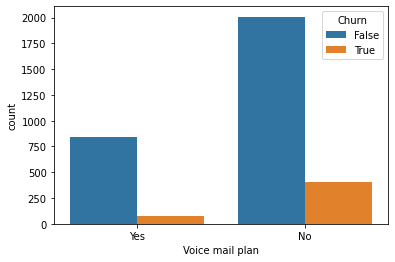

In [143]:
sns.countplot(x=df['Voice mail plan'],hue=df['Churn'])

In [144]:
churn_voicemail_plan = df[df['Churn']==True]['Voice mail plan'].value_counts()
print(churn_voicemail_plan)

print("Voice mail plan details for churn customers")

print((churn_voicemail_plan/(churn_dict[True])*100))

No     403
Yes     80
Name: Voice mail plan, dtype: int64
Voice mail plan details for churn customers
No     83.436853
Yes    16.563147
Name: Voice mail plan, dtype: float64


**Observation:**

83% of churn customers doesn't have voice mail plan


In [145]:
non_churn_voicemail_plan = df[df['Churn']==False]['Voice mail plan'].value_counts()
print(non_churn_voicemail_plan)

print("Voice mail plan details for non_churn customers")

print((non_churn_voicemail_plan/(churn_dict[False])*100))

No     2008
Yes     842
Name: Voice mail plan, dtype: int64
Voice mail plan details for non_churn customers
No     70.45614
Yes    29.54386
Name: Voice mail plan, dtype: float64


**Observation:**

70% of non_churn customers doesn't have voice mail plan

# Bi-Variate Analysis

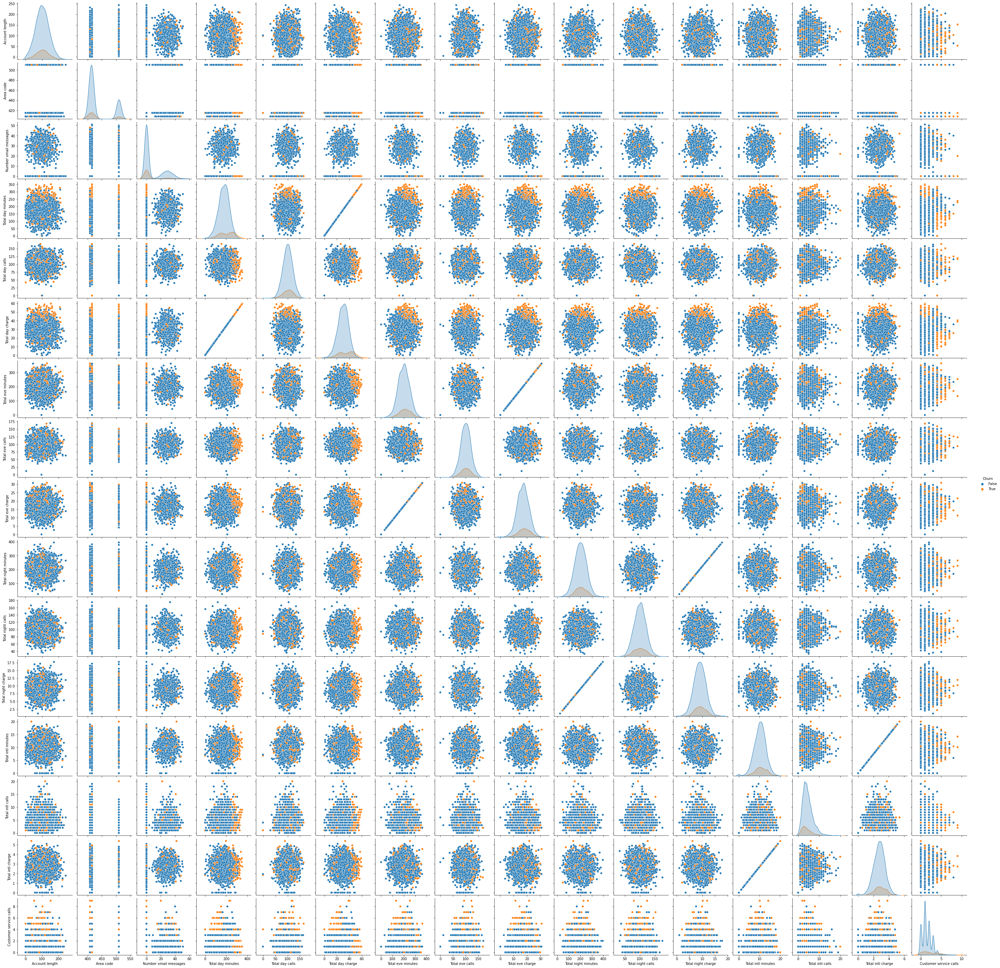

In [146]:
df_numerical['Churn']=df['Churn']
sns.pairplot(data=df_numerical,hue='Churn',kind='scatter')
plt.show()

In [147]:
df_numerical.head()

,Account length,Area code,Number vmail messages,Total day minutes,Total day calls,Total day charge,Total eve minutes,Total eve calls,Total eve charge,Total night minutes,Total night calls,Total night charge,Total intl minutes,Total intl calls,Total intl charge,Customer service calls,Churn
0,128,415,25,265.1,110,45.07,197.4,99,16.78,244.7,91,11.01,10.0,3,2.70,1,False
1,107,415,26,161.6,123,27.47,195.5,103,16.62,254.4,103,11.45,13.7,3,3.70,1,False
2,137,415,0,243.4,114,41.38,121.2,110,10.30,162.6,104,7.32,12.2,5,3.29,0,False
3,84,408,0,299.4,71,50.90,61.9,88,5.26,196.9,89,8.86,6.6,7,1.78,2,False
4,75,415,0,166.7,113,28.34,148.3,122,12.61,186.9,121,8.41,10.1,3,2.73,3,False


Analysing the Total day minutes & Total day charge will help in predicting the label

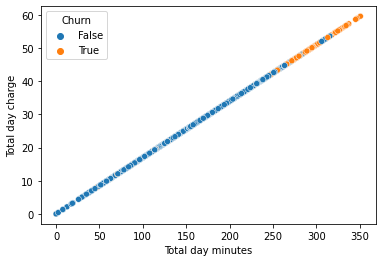

In [148]:
sns.scatterplot(x=df['Total day minutes'],y=df['Total day charge'],hue=df['Churn'])
plt.show()

Observation:

Both Total day charge and Total day minutes are linearly increaing with respect to each other.
Hence there coulde be highly possitive correlation between them.


In [149]:
daychrg_daymin = df[(df['Total day minutes']>=230) & (df['Total day charge']>=40)]['Churn'].value_counts()
daychrg_daymin

False    318
True     198
Name: Churn, dtype: int64

In [150]:
daychrg_daymin_dict = daychrg_daymin.to_dict()
daychrg_daymin_dict

{False: 318, True: 198}

In [151]:
print("{}% of churn customers are having tot_day_minutes>=230 and Total day charge>=40".format(np.round((daychrg_daymin_dict[True]/churn_dict[True])*100,2)))


40.99% of churn customers are having tot_day_minutes>=230 and Total day charge>=40


Analysing the Total eve minutes & Total eve charge will help in predicting the label

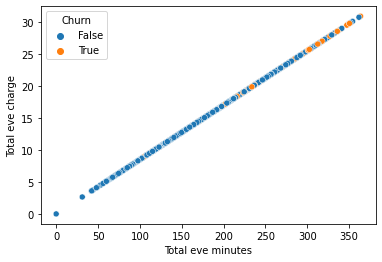

In [152]:
sns.scatterplot(x=df['Total eve minutes'],y=df['Total eve charge'],hue=df['Churn'])
plt.show()

Observation:

Both Total eve charge and Total eve minutes are linearly increaing with respect to each other.
Hence there coulde be highly possitive correlation between them.


In [153]:
df_numerical_excld_churn = df_numerical.drop(['Churn'],axis=1)

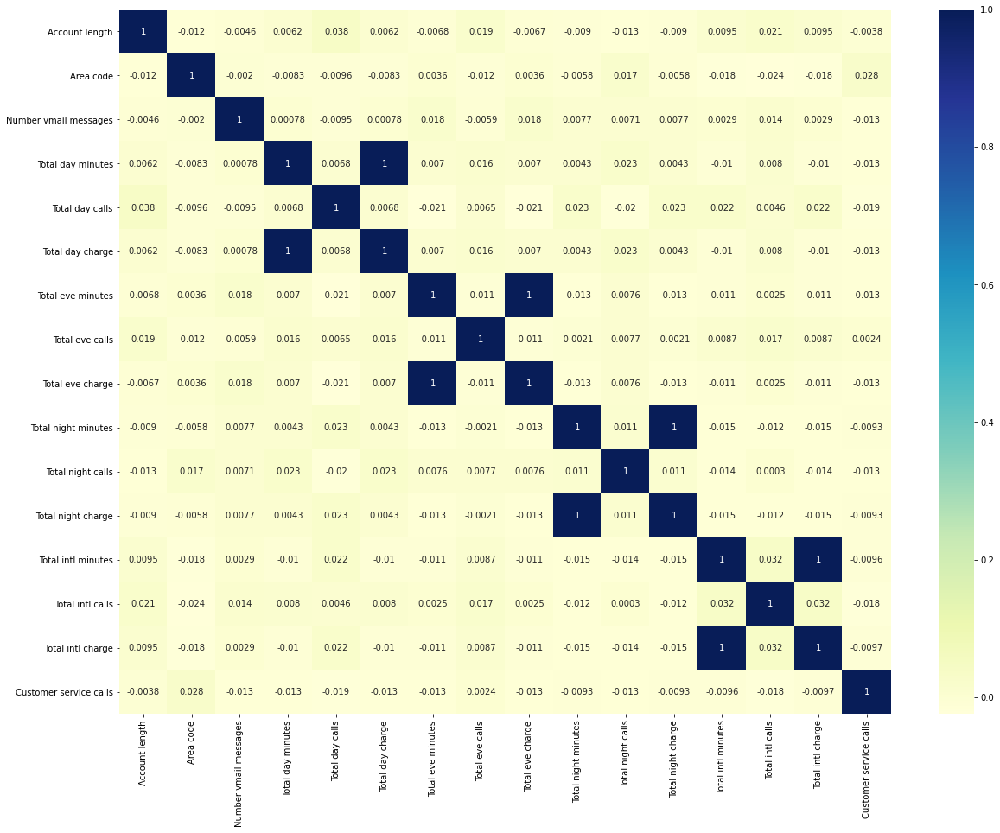

In [154]:
fig, ax = plt.subplots(figsize=(20,15))
sns.heatmap(df_numerical_excld_churn.corr(),cmap="YlGnBu",annot=True)


Observation:

There are few features which are highly corelated to each other with pearson correlation = 1.

In [155]:
#Finding the correlated features in the form of dictionaries
corr = np.array(df_numerical_excld_churn.corr())#converting the correlation dataframe to array so that we can access each correlation value. 
rel_colmns={}#empty dict to stire the correlated features as key-value pairs
for i in range(len(df_numerical_excld_churn.corr())):
    for j in range(len(df_numerical_excld_churn.corr())):
        if abs(corr[i][j])>=0.9:#checks for the absolute correaltion values >0.9
            rel_colmns[df_numerical_excld_churn.columns[i]]=df_numerical_excld_churn.columns[j]#Assigning >0.9 correlated features to dictionary as key value pairs

print(rel_colmns)


        

{'Account length': 'Account length', 'Area code': 'Area code', 'Number vmail messages': 'Number vmail messages', 'Total day minutes': 'Total day charge', 'Total day calls': 'Total day calls', 'Total day charge': 'Total day charge', 'Total eve minutes': 'Total eve charge', 'Total eve calls': 'Total eve calls', 'Total eve charge': 'Total eve charge', 'Total night minutes': 'Total night charge', 'Total night calls': 'Total night calls', 'Total night charge': 'Total night charge', 'Total intl minutes': 'Total intl charge', 'Total intl calls': 'Total intl calls', 'Total intl charge': 'Total intl charge', 'Customer service calls': 'Customer service calls'}


Observation:

Above is the dictionary where we could find the correlated features as key-value pairs.

Hence we can drop those correlated features.


In [156]:
#printing the data fram after removing the corelated features
df = df.drop(['Total day minutes',"Total eve minutes","Total night minutes","Total intl minutes"],axis=1)
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,OH,107,415,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,NJ,137,415,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,OH,84,408,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,OK,75,415,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False


In [157]:
df.shape

(3333, 16)

# Detecting and removing outliers

In [158]:
df['Total day calls'].describe()

count    3333.000000
mean      100.435644
std        20.069084
min         0.000000
25%        87.000000
50%       101.000000
75%       114.000000
max       165.000000
Name: Total day calls, dtype: float64

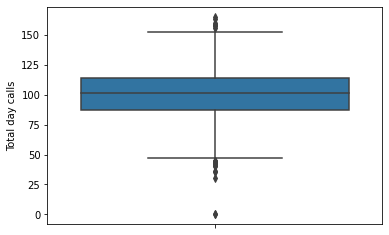

In [159]:
sns.boxplot(y=df['Total day calls'])

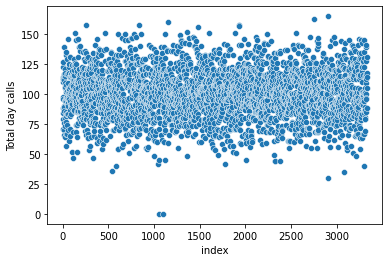

In [160]:
sns.scatterplot(x=df.reset_index()['index'],y=df['Total day calls'])

**Observation:**

we can see few points are unsuall and far from the distribution of data.

In [161]:
#finding the Q1(25%) & Q2(75%) & IQR

Q1 = df['Total day calls'].quantile(q=0.25)
Q3 = df['Total day calls'].quantile(q=0.75)
IQR = Q3-Q1
print(IQR)

27.0


In [162]:
lower_whisker = Q1-1.5*(IQR)
upper_whisker = Q3+1.5*(IQR)
df = df[~(df['Total day calls']<lower_whisker)|(df['Total day calls']>upper_whisker)]

In [163]:
 len(df)#Now the df size got reduced

3318

In [164]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,OH,107,415,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,NJ,137,415,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,OH,84,408,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,OK,75,415,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False


On Total day charge

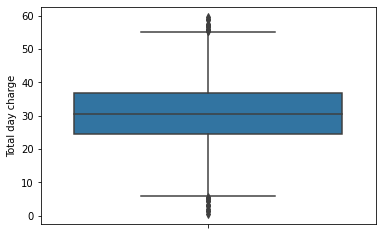

In [165]:
sns.boxplot(y=df['Total day charge'])

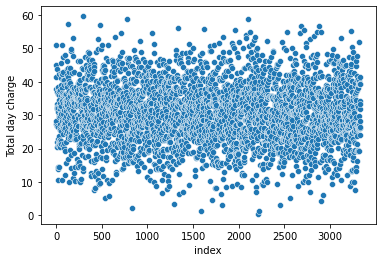

In [166]:
sns.scatterplot(x=df.reset_index()['index'],y=df['Total day charge'])

In [167]:
Q1 = df['Total day charge'].quantile(q=0.25)
Q3 = df['Total day charge'].quantile(q=0.75)
IQR = Q3-Q1
print(IQR)

12.355000000000004


In [168]:
lower_whisker = Q1-1.5*(IQR)
upper_whisker = Q3+1.5*(IQR)
df = df[~(df['Total day charge']<lower_whisker)|(df['Total day charge']>upper_whisker)]
df

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,OH,107,415,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,NJ,137,415,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,OH,84,408,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,OK,75,415,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3328,WI,114,415,No,Yes,26,88,23.31,125,13.23,94,11.14,7,3.11,2,False
3329,AL,106,408,No,Yes,29,131,14.21,131,17.33,73,10.33,3,2.19,1,False
3330,VT,60,415,No,No,0,118,32.96,110,7.23,134,9.45,8,3.56,3,False
3331,WV,159,415,No,No,0,114,28.87,105,16.80,82,8.72,4,3.13,1,False


In [169]:
df.shape

(3306, 16)

**Dropping useless features:**

In [170]:
df.head()

,State,Account length,Area code,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,KS,128,415,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,OH,107,415,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,NJ,137,415,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,OH,84,408,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,OK,75,415,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False


In [171]:
df = df.drop(['Account length','State','Area code'],axis=1)

In [172]:
df.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn
0,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False
1,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False
2,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False
3,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False
4,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False


In [173]:
df['per_day_call_chrge_on_avg'] = df['Total day charge']/df['Total day calls']
df['per_eve_call_chrge_on_avg'] = df['Total eve charge']/df['Total eve calls']
df['per_night_call_chrge_on_avg'] = df['Total night charge']/df['Total night calls']
df['per_intl_call_chrge_on_avg'] = df['Total intl charge']/df['Total intl calls']


In [174]:
df.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg
0,No,Yes,25,110,45.07,99,16.78,91,11.01,3,2.70,1,False,0.409727,0.169495,0.120989,0.900000
1,No,Yes,26,123,27.47,103,16.62,103,11.45,3,3.70,1,False,0.223333,0.161359,0.111165,1.233333
2,No,No,0,114,41.38,110,10.30,104,7.32,5,3.29,0,False,0.362982,0.093636,0.070385,0.658000
3,Yes,No,0,71,50.90,88,5.26,89,8.86,7,1.78,2,False,0.716901,0.059773,0.099551,0.254286
4,Yes,No,0,113,28.34,122,12.61,121,8.41,3,2.73,3,False,0.250796,0.103361,0.069504,0.910000


In [175]:
df.isnull().sum(axis=0)

International plan              0
Voice mail plan                 0
Number vmail messages           0
Total day calls                 0
Total day charge                0
Total eve calls                 0
Total eve charge                0
Total night calls               0
Total night charge              0
Total intl calls                0
Total intl charge               0
Customer service calls          0
Churn                           0
per_day_call_chrge_on_avg       0
per_eve_call_chrge_on_avg       1
per_night_call_chrge_on_avg     0
per_intl_call_chrge_on_avg     18
dtype: int64

In [176]:
df[df.isnull().any(axis=1)]

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg
145,No,No,0,122,39.46,112,24.85,112,9.05,0,0.00,3,False,0.323443,0.221875,0.080804,NaN
278,No,Yes,21,98,10.98,86,14.97,84,11.02,0,0.00,2,False,0.112041,0.174070,0.131190,NaN
393,No,No,0,126,41.29,65,17.83,126,10.28,0,0.00,1,False,0.327698,0.274308,0.081587,NaN
477,No,Yes,28,95,25.74,97,12.95,109,11.25,0,0.00,1,False,0.270947,0.133505,0.103211,NaN
559,No,No,0,104,19.45,101,6.66,78,10.47,0,0.00,2,False,0.187019,0.065941,0.134231,NaN
694,No,No,0,66,47.77,108,13.65,74,3.51,0,0.00,1,False,0.723788,0.126389,0.047432,NaN
814,No,No,0,114,37.88,113,18.35,122,10.06,0,0.00,1,False,0.332281,0.162389,0.082459,NaN
853,No,No,0,88,32.56,78,14.89,118,9.91,0,0.00,0,False,0.370000,0.190897,0.083983,NaN
1103,No,No,0,90,22.44,75,16.79,114,7.91,0,0.00,3,False,0.249333,0.223867,0.069386,NaN
1890,No,No,0,101,48.98,93,11.72,88,9.29,0,0.00,0,False,0.484950,0.126022,0.105568,NaN


In [177]:
df[df['Total eve calls']==0]

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg
2358,No,No,0,134,35.56,0,0.0,94,7.89,6,3.19,1,False,0.265373,NaN,0.083936,0.531667


In [178]:
df['per_eve_call_chrge_on_avg'].fillna(0.0,inplace=True)
df['per_intl_call_chrge_on_avg'].fillna(0.0,inplace=True)

In [179]:
df.isnull().sum(axis=0)

International plan             0
Voice mail plan                0
Number vmail messages          0
Total day calls                0
Total day charge               0
Total eve calls                0
Total eve charge               0
Total night calls              0
Total night charge             0
Total intl calls               0
Total intl charge              0
Customer service calls         0
Churn                          0
per_day_call_chrge_on_avg      0
per_eve_call_chrge_on_avg      0
per_night_call_chrge_on_avg    0
per_intl_call_chrge_on_avg     0
dtype: int64

In [180]:
df_cat = df.select_dtypes(include=['object','bool'])
df_cat_list = list(df.select_dtypes(include=['object','bool']).columns)
df_cat_list

['International plan', 'Voice mail plan', 'Churn']

In [181]:
from sklearn import preprocessing
le = preprocessing.LabelEncoder()
for i in df_cat_list:
    df[i] = le.fit_transform(df[i])
df.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,Churn,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg
0,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0,0.409727,0.169495,0.120989,0.900000
1,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0,0.223333,0.161359,0.111165,1.233333
2,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0,0.362982,0.093636,0.070385,0.658000
3,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0,0.716901,0.059773,0.099551,0.254286
4,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0,0.250796,0.103361,0.069504,0.910000


In [182]:
#onehotencoding the state feature for reference


# from sklearn import preprocessing
# ohe = preprocessing.OneHotEncoder()
# df_ohe = pd.DataFrame(ohe.fit_transform(np.array(df['State']).reshape(-1,1)).toarray())
# df_ohe.head()

In [183]:
df.columns.tolist()

['International plan',
 'Voice mail plan',
 'Number vmail messages',
 'Total day calls',
 'Total day charge',
 'Total eve calls',
 'Total eve charge',
 'Total night calls',
 'Total night charge',
 'Total intl calls',
 'Total intl charge',
 'Customer service calls',
 'Churn',
 'per_day_call_chrge_on_avg',
 'per_eve_call_chrge_on_avg',
 'per_night_call_chrge_on_avg',
 'per_intl_call_chrge_on_avg']

In [184]:
df = df[['International plan','Voice mail plan','Number vmail messages','Total day calls','Total day charge','Total eve calls','Total eve charge','Total night calls','Total night charge','Total intl calls','Total intl charge','Customer service calls','per_day_call_chrge_on_avg','per_eve_call_chrge_on_avg','per_night_call_chrge_on_avg','per_intl_call_chrge_on_avg','Churn']]

In [185]:
df.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg,Churn
0,0,1,25,110,45.07,99,16.78,91,11.01,3,2.70,1,0.409727,0.169495,0.120989,0.900000,0
1,0,1,26,123,27.47,103,16.62,103,11.45,3,3.70,1,0.223333,0.161359,0.111165,1.233333,0
2,0,0,0,114,41.38,110,10.30,104,7.32,5,3.29,0,0.362982,0.093636,0.070385,0.658000,0
3,1,0,0,71,50.90,88,5.26,89,8.86,7,1.78,2,0.716901,0.059773,0.099551,0.254286,0
4,1,0,0,113,28.34,122,12.61,121,8.41,3,2.73,3,0.250796,0.103361,0.069504,0.910000,0


In [186]:
from sklearn.preprocessing import StandardScaler
std_scalar = StandardScaler()
for i in list(df.iloc[:,2:16].columns.values):
    df[i]=std_scalar.fit_transform(np.array(df[i]).reshape(-1,1))
df.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg,Churn
0,0,1,1.237526,0.475169,1.581853,-0.055074,-0.071442,-0.466079,0.865760,-0.603593,-0.088627,-0.427687,0.777468,-0.141274,0.840839,0.108964,0
1,0,1,1.310652,1.138797,-0.351410,0.145947,-0.108552,0.147564,1.059031,-0.603593,1.237289,-0.427687,-0.792142,-0.264706,0.533381,0.656406,0
2,0,0,-0.590627,0.679363,1.176527,0.497734,-1.574409,0.198701,-0.755083,0.209229,0.693664,-1.187051,0.383833,-1.292167,-0.742915,-0.288478,0
3,1,0,-0.590627,-1.515715,2.222246,-0.607882,-2.743384,-0.568352,-0.078634,1.022051,-1.308470,0.331676,3.364159,-1.805932,0.169885,-0.951509,0
4,1,0,-0.590627,0.628314,-0.255846,1.100797,-1.038629,1.068027,-0.276297,-0.603593,-0.048850,1.091039,-0.560877,-1.144635,-0.770471,0.125388,0


In [187]:
x_train = df.iloc[:,0:16]
y_train = df['Churn']


In [188]:
x_train.head()

,International plan,Voice mail plan,Number vmail messages,Total day calls,Total day charge,Total eve calls,Total eve charge,Total night calls,Total night charge,Total intl calls,Total intl charge,Customer service calls,per_day_call_chrge_on_avg,per_eve_call_chrge_on_avg,per_night_call_chrge_on_avg,per_intl_call_chrge_on_avg
0,0,1,1.237526,0.475169,1.581853,-0.055074,-0.071442,-0.466079,0.865760,-0.603593,-0.088627,-0.427687,0.777468,-0.141274,0.840839,0.108964
1,0,1,1.310652,1.138797,-0.351410,0.145947,-0.108552,0.147564,1.059031,-0.603593,1.237289,-0.427687,-0.792142,-0.264706,0.533381,0.656406
2,0,0,-0.590627,0.679363,1.176527,0.497734,-1.574409,0.198701,-0.755083,0.209229,0.693664,-1.187051,0.383833,-1.292167,-0.742915,-0.288478
3,1,0,-0.590627,-1.515715,2.222246,-0.607882,-2.743384,-0.568352,-0.078634,1.022051,-1.308470,0.331676,3.364159,-1.805932,0.169885,-0.951509
4,1,0,-0.590627,0.628314,-0.255846,1.100797,-1.038629,1.068027,-0.276297,-0.603593,-0.048850,1.091039,-0.560877,-1.144635,-0.770471,0.125388


In [189]:
y_train.head()

0    0
1    0
2    0
3    0
4    0
Name: Churn, dtype: int64

In [190]:
models_performance = {'model':[],'cv_recall_score':[],'log_loss':[],'precision_score':[],'recall_score':[],'f1_score':[]}

In [191]:
from sklearn.model_selection import train_test_split
train_x,test_x,train_y,test_y=train_test_split(x_train,y_train,stratify=y_train,test_size=0.2,random_state=4)
#stratify = y_train makes the split in equal proportions of its class labels both in train_y,test_y
#for more information on train_test_split....visit below url
#https://realpython.com/train-test-split-python-data/
print(train_x.shape)
print(test_x.shape)
print(train_y.value_counts())
print(test_y.value_counts())

(2644, 16)
(662, 16)
0    2262
1     382
Name: Churn, dtype: int64
0    566
1     96
Name: Churn, dtype: int64


# Gaussian Naive Bayes:

In [192]:
d = {'Model_Name':[],'Test_Accuracy':[],'Test_Log_Loss':[]}

In [193]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(train_x,train_y)

GaussianNB(priors=None, var_smoothing=1e-09)

              precision    recall  f1-score   support

           0       0.91      0.90      0.90       566
           1       0.44      0.45      0.44        96

    accuracy                           0.84       662
   macro avg       0.67      0.68      0.67       662
weighted avg       0.84      0.84      0.84       662



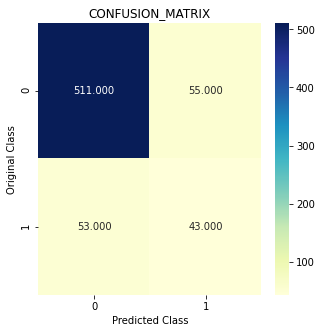

Number of mis-classified points : 0.16314199395770393
log_loss for cv_data 0.43874701332554594


In [194]:
from sklearn.metrics import accuracy_score,recall_score,precision_score,confusion_matrix,f1_score,log_loss
pred_cv_y = gnb.predict(test_x)
# y_pred = gnb.predict(x_test)
y_predict_proba = gnb.predict_proba(test_x)
# models_performance['model'].append('gnb')
# models_performance['cv_recall_score'].append(recall_score(cv_y,pred_cv_y))
# models_performance['precision_score'].append(precision_score(y_test,y_pred))
# models_performance['recall_score'].append(recall_score(y_test,y_pred))
# models_performance['f1_score'].append(f1_score(y_test,y_pred))
#models_performance['log_loss'].append(log_loss(y_test,y_predict_proba))
from sklearn.metrics import classification_report
print(classification_report(test_y, pred_cv_y, labels=[0,1]))
C = confusion_matrix(test_y,pred_cv_y)
plt.figure(figsize=(5,5))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Number of mis-classified points :", np.count_nonzero((pred_cv_y - test_y))/test_y.shape[0])
print("log_loss for cv_data",log_loss(test_y,y_predict_proba))

Observation:

Since we have imbalanced dataset we are getting very less precision and recall values for class 1

We will balance the data set using smote technique

In [195]:
#Applying smote technique on train data
from imblearn.combine import SMOTEENN
sm = SMOTEENN()
x_train_resampled, y_train_resampled = sm.fit_resample(x_train,y_train)
xr_train,xr_test,yr_train,yr_test=train_test_split(x_train_resampled, y_train_resampled,test_size=0.2)
x_act_train,x_act_cv,y_act_train,y_act_cv = train_test_split(xr_train, yr_train,test_size=0.2)


# **Gaussian Naive Bayes with Balanced Data**

Train_accuracy : 0.8005865102639296
CV_accuracy : 0.78515625
Test_accuracy : 0.771875
log loss of train data is : 0.5407170009426032
log loss of cv data is : 0.5551341012783552
log loss of test data is : 0.5928824836478997
Classification report for CV data
              precision    recall  f1-score   support

           0       0.76      0.73      0.74       328
           1       0.81      0.82      0.81       440

    accuracy                           0.79       768
   macro avg       0.78      0.78      0.78       768
weighted avg       0.78      0.79      0.78       768

Classification report for test data
              precision    recall  f1-score   support

           0       0.71      0.73      0.72       388
           1       0.81      0.80      0.81       572

    accuracy                           0.77       960
   macro avg       0.76      0.77      0.76       960
weighted avg       0.77      0.77      0.77       960

Confusion Matrix of CV data


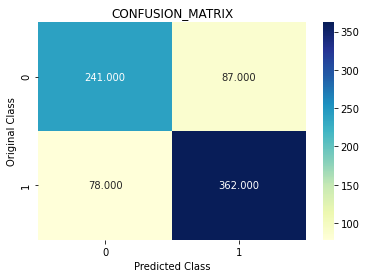

Confusion Matrix of test data


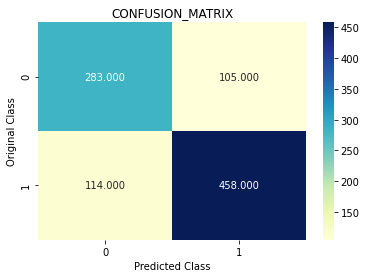

Number of mis-classified points in cv_data: 0.21484375
Number of mis-classified points in test_data: 0.228125


In [196]:
from sklearn.naive_bayes import GaussianNB
gnb=GaussianNB()
gnb.fit(x_act_train,y_act_train)
train_probs = gnb.predict_proba(x_act_train)
cv_probs = gnb.predict_proba(x_act_cv)
test_probs = gnb.predict_proba(xr_test)
print("Train_accuracy :",gnb.score(x_act_train,y_act_train))
print("CV_accuracy :",gnb.score(x_act_cv,y_act_cv))
print("Test_accuracy :",gnb.score(xr_test,yr_test))
print("log loss of train data is :",log_loss(y_act_train,train_probs))
print("log loss of cv data is :",log_loss(y_act_cv,cv_probs))
print("log loss of test data is :",log_loss(yr_test,test_probs))
print("Classification report for CV data")
print(classification_report(y_act_cv, gnb.predict(x_act_cv), labels=[0,1]))
print("Classification report for test data")
print(classification_report(yr_test, gnb.predict(xr_test), labels=[0,1]))
print("Confusion Matrix of CV data")
C=confusion_matrix(y_act_cv,gnb.predict(x_act_cv))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,gnb.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Number of mis-classified points in cv_data:", np.count_nonzero((gnb.predict(x_act_cv) - y_act_cv))/y_act_cv.shape[0])
print("Number of mis-classified points in test_data:", np.count_nonzero((gnb.predict(xr_test)-yr_test))/yr_test.shape[0])
d['Model_Name'].append("Gaussian NB")
d['Test_Accuracy'].append(gnb.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,test_probs))

# **Logistic Regression on Balanced Data**

for alpha = 1e-06
CV_Log Loss : 0.5063458586857832
Train_Log Loss : 0.49372680505884614
train_acc : 0.7901596611274031
cv_acc : 0.7838541666666666
for alpha = 1e-05
CV_Log Loss : 0.4823494969518351
Train_Log Loss : 0.46818491281390917
train_acc : 0.7950472466601499
cv_acc : 0.7903645833333334
for alpha = 0.0001
CV_Log Loss : 0.4635209318478625
Train_Log Loss : 0.44972700647603975
train_acc : 0.8084066471163245
cv_acc : 0.7994791666666666
for alpha = 0.001
CV_Log Loss : 0.45808871011392166
Train_Log Loss : 0.44545492240665147
train_acc : 0.8145975887911372
cv_acc : 0.8098958333333334
for alpha = 0.01
CV_Log Loss : 0.46416830642884155
Train_Log Loss : 0.45295131585012155
train_acc : 0.80514825676116
cv_acc : 0.8072916666666666
for alpha = 0.1
CV_Log Loss : 0.4967070972527677
Train_Log Loss : 0.49259881246220816
train_acc : 0.7839687194525904
cv_acc : 0.76171875
for alpha = 1
CV_Log Loss : 0.526427942640422
Train_Log Loss : 0.5249334783414159
train_acc : 0.740632127728902
cv_acc : 0.73046

Text(0, 0.5, 'Accuracy')

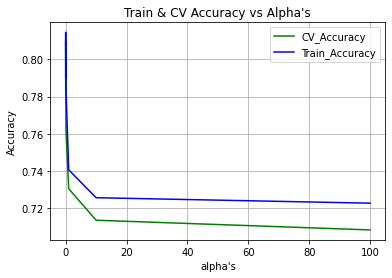

In [197]:
alpha = [10 ** x for x in range(-6, 3)]
cv_log_error_array = []
train_log_error_array=[]
cv_accuracy=[]
train_accuracy=[]
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='log', random_state=42)
    clf.fit(x_act_train,y_act_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(x_act_train,y_act_train)
    sig_clf_probs = sig_clf.predict_proba(x_act_cv)
    cv_log_error_array.append(log_loss(y_act_cv, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    train_log_error_array.append(log_loss(y_act_train, sig_clf.predict_proba(x_act_train), labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("CV_Log Loss :",log_loss(y_act_cv, sig_clf_probs))
    print("Train_Log Loss :",log_loss(y_act_train, sig_clf.predict_proba(x_act_train)))
    train_accuracy.append(sig_clf.score(x_act_train,y_act_train))
    cv_accuracy.append(sig_clf.score(x_act_cv,y_act_cv))
    print("train_acc :",sig_clf.score(x_act_train,y_act_train))
    print("cv_acc :",sig_clf.score(x_act_cv,y_act_cv))
#printing best alpha value where we have minimum log-loss
plt.plot(alpha,cv_accuracy,'g',label ="CV_Accuracy")
plt.plot(alpha,train_accuracy,'b',label ="Train_Accuracy")
plt.grid()
plt.legend()
plt.title("Train & CV Accuracy vs Alpha's")
plt.xlabel("alpha's")
plt.ylabel("Accuracy")




**Observation:**

We can see that alpha =0.001 giving best accuracies and log-losses i.e
CV_Log Loss : 0.5132414101641823
Train_Log Loss : 0.46541527785279446
train_acc : 0.7996077149395228
cv_acc : 0.7673202614379085

**Trainig the logistic Regression with best alpha value**

log loss of test data is : 0.4780627004930506
Classification report for CV data
              precision    recall  f1-score   support

           0       0.78      0.77      0.78       328
           1       0.83      0.84      0.84       440

    accuracy                           0.81       768
   macro avg       0.81      0.80      0.81       768
weighted avg       0.81      0.81      0.81       768

Classification report for test data
              precision    recall  f1-score   support

           0       0.75      0.76      0.75       388
           1       0.83      0.83      0.83       572

    accuracy                           0.80       960
   macro avg       0.79      0.79      0.79       960
weighted avg       0.80      0.80      0.80       960

Confusion Matrix of CV data


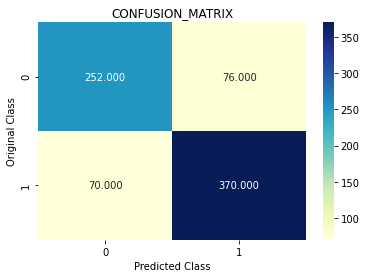

Confusion Matrix of test data


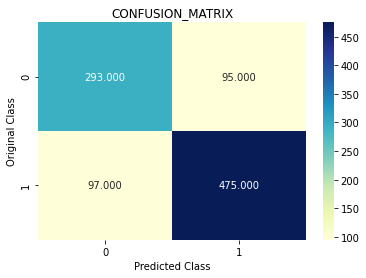

Number of mis-classified points in cv_data: 0.19010416666666666
Number of mis-classified points in test_data: 0.2
Test_Accuracy : 0.8


In [198]:
clf = SGDClassifier(alpha=0.001, penalty='l2', loss='log', random_state=42)
clf.fit(x_act_train,y_act_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(x_act_train,y_act_train)
test_probs = sig_clf.predict_proba(xr_test)
print("log loss of test data is :",log_loss(yr_test,test_probs))
print("Classification report for CV data")
print(classification_report(y_act_cv, sig_clf.predict(x_act_cv), labels=[0,1]))
print("Classification report for test data")
print(classification_report(yr_test, sig_clf.predict(xr_test), labels=[0,1]))
print("Confusion Matrix of CV data")
C=confusion_matrix(y_act_cv,sig_clf.predict(x_act_cv))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,sig_clf.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()

print("Number of mis-classified points in cv_data:", np.count_nonzero((sig_clf.predict(x_act_cv) - y_act_cv))/y_act_cv.shape[0])
print("Number of mis-classified points in test_data:", np.count_nonzero((sig_clf.predict(xr_test)-yr_test))/yr_test.shape[0])
print("Test_Accuracy :",sig_clf.score(xr_test,yr_test))
d['Model_Name'].append("Logistic Regression")
d['Test_Accuracy'].append(sig_clf.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,test_probs))

# **K-Nearest Neighbors on Balanced Data**

for alpha = 3
Log Loss on CV_data: 0.07443206535980777
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 5
Log Loss on CV_data: 0.1097034275717284
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 7
Log Loss on CV_data: 0.1378610176891183
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 9
Log Loss on CV_data: 0.16433097103230068
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 11
Log Loss on CV_data: 0.19303365176156154
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 15
Log Loss on CV_data: 0.22904370651904893
Log Loss on train_data: 0.44545492240665147
cv_acc : 0.8098958333333334
train_acc : 0.8145975887911372
for alpha = 21
Log Loss on CV_data: 0.27399962301133

Text(0, 0.5, 'Accuracy')

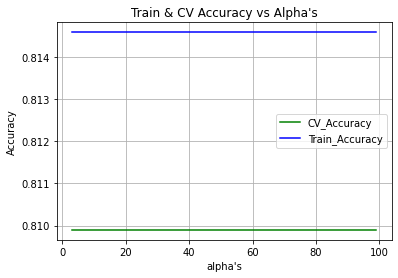

In [199]:
alpha = [3,5,7,9,11, 15, 21, 31, 41, 51, 99]
cv_log_error_array = []
train_log_error_array =[]
cv_accuracy=[]
train_accuracy=[]
for i in alpha:
    print("for alpha =", i)
    clf = KNeighborsClassifier(n_neighbors=i)
    clf.fit(x_act_train,y_act_train)
    clf = CalibratedClassifierCV(clf, method="sigmoid")
    clf.fit(x_act_train,y_act_train)
    sig_clf_probs = clf.predict_proba(x_act_cv)
    cv_log_error_array.append(log_loss(y_act_cv, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    train_log_error_array.append(log_loss(y_act_train,sig_clf.predict_proba(x_act_train),labels=clf.classes_, eps=1e-15))
    print("Log Loss on CV_data:",log_loss(y_act_cv, sig_clf_probs))
    print("Log Loss on train_data:",log_loss(y_act_train,sig_clf.predict_proba(x_act_train)))
    print("cv_acc :",sig_clf.score(x_act_cv,y_act_cv))
    print("train_acc :",sig_clf.score(x_act_train,y_act_train)) 
    cv_accuracy.append(sig_clf.score(x_act_cv,y_act_cv))
    train_accuracy.append(sig_clf.score(x_act_train,y_act_train))
plt.plot(alpha,cv_accuracy,'g',label ="CV_Accuracy")
plt.plot(alpha,train_accuracy,'b',label ="Train_Accuracy")
plt.grid()
plt.legend()
plt.title("Train & CV Accuracy vs Alpha's")
plt.xlabel("alpha's")
plt.ylabel("Accuracy")

**Observation :**
We can conclude that as the number of nearest neighbors increasing there is a decrease in accuracy values.
Hence we are consider best nearest neighbors value=3.
Log Loss on CV_data: 0.08126802872786403
Log Loss on train_data: 0.03229991704263273
cv_acc : 0.9660130718954248
train_acc : 0.9947695325269696

Test_Accuracy :  0.971875
Test Log_loss :  0.07500275417493045
Classification report for CV data
              precision    recall  f1-score   support

           0       1.00      0.95      0.97       328
           1       0.96      1.00      0.98       440

    accuracy                           0.98       768
   macro avg       0.98      0.98      0.98       768
weighted avg       0.98      0.98      0.98       768

Classification report for test data
              precision    recall  f1-score   support

           0       0.98      0.95      0.96       388
           1       0.97      0.99      0.98       572

    accuracy                           0.97       960
   macro avg       0.97      0.97      0.97       960
weighted avg       0.97      0.97      0.97       960

Confusion Matrix of CV data


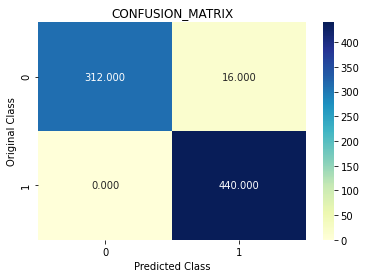

Confusion Matrix of test data


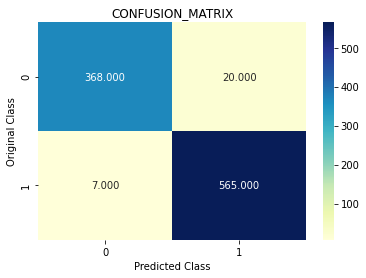

Number of mis-classified points in cv_data: 0.020833333333333332
Number of mis-classified points in test_data: 0.028125


In [200]:
clf = KNeighborsClassifier(n_neighbors=3)
clf.fit(x_act_train,y_act_train)
knn_sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
knn_sig_clf.fit(x_act_train,y_act_train)
print("Test_Accuracy : ",knn_sig_clf.score(xr_test,yr_test))
print("Test Log_loss : ",log_loss(yr_test,knn_sig_clf.predict_proba(xr_test)))
print("Classification report for CV data")
print(classification_report(y_act_cv, knn_sig_clf.predict(x_act_cv), labels=[0,1]))
print("Classification report for test data")
print(classification_report(yr_test, knn_sig_clf.predict(xr_test), labels=[0,1]))
print("Confusion Matrix of CV data")
C=confusion_matrix(y_act_cv,knn_sig_clf.predict(x_act_cv))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,knn_sig_clf.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()

print("Number of mis-classified points in cv_data:", np.count_nonzero((knn_sig_clf.predict(x_act_cv) - y_act_cv))/y_act_cv.shape[0])
print("Number of mis-classified points in test_data:", np.count_nonzero((knn_sig_clf.predict(xr_test)-yr_test))/yr_test.shape[0])
d['Model_Name'].append("KNN")
d['Test_Accuracy'].append(knn_sig_clf.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,knn_sig_clf.predict_proba(xr_test)))

# **Linear SVM**

for alpha = 1e-05
CV_Log Loss : 0.496800585657978
Train_Log Loss : 0.48725559950388597
train_acc : 0.8002606712284132
cv_acc : 0.8046875
for alpha = 0.0001
CV_Log Loss : 0.48103689819671375
Train_Log Loss : 0.4709145226432222
train_acc : 0.8097100032583904
cv_acc : 0.7994791666666666
for alpha = 0.001
CV_Log Loss : 0.4569816304194389
Train_Log Loss : 0.44511878550504114
train_acc : 0.8155751058976866
cv_acc : 0.8177083333333334
for alpha = 0.01
CV_Log Loss : 0.45985007689254953
Train_Log Loss : 0.4501373566622187
train_acc : 0.8123167155425219
cv_acc : 0.8190104166666666
for alpha = 0.1
CV_Log Loss : 0.48342402272156954
Train_Log Loss : 0.4781451441418574
train_acc : 0.7885304659498208
cv_acc : 0.7799479166666666
for alpha = 1
CV_Log Loss : 0.5173096228975823
Train_Log Loss : 0.5159345347727275
train_acc : 0.7536656891495601
cv_acc : 0.7330729166666666
for alpha = 10
CV_Log Loss : 0.5425689236559803
Train_Log Loss : 0.5411820551683362
train_acc : 0.7223851417399805
cv_acc : 0.70703125


Text(0, 0.5, 'Accuracy')

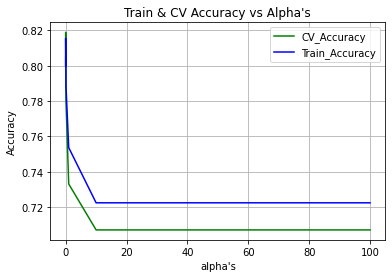

In [201]:
alpha = [10 ** x for x in range(-5, 3)]
cv_log_error_array = []
train_log_error_array=[]
cv_accuracy=[]
train_accuracy=[]
for i in alpha:
    print("for alpha =", i)
    clf = SGDClassifier(alpha=i, penalty='l2', loss='hinge', random_state=42)
    clf.fit(x_act_train,y_act_train)
    sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
    sig_clf.fit(x_act_train,y_act_train)
    sig_clf_probs = sig_clf.predict_proba(x_act_cv)
    cv_log_error_array.append(log_loss(y_act_cv, sig_clf_probs, labels=clf.classes_, eps=1e-15))
    train_log_error_array.append(log_loss(y_act_train, sig_clf.predict_proba(x_act_train), labels=clf.classes_, eps=1e-15))
    # to avoid rounding error while multiplying probabilites we use log-probability estimates
    print("CV_Log Loss :",log_loss(y_act_cv, sig_clf_probs))
    print("Train_Log Loss :",log_loss(y_act_train, sig_clf.predict_proba(x_act_train)))
    train_accuracy.append(sig_clf.score(x_act_train,y_act_train))
    cv_accuracy.append(sig_clf.score(x_act_cv,y_act_cv))
    print("train_acc :",sig_clf.score(x_act_train,y_act_train))
    print("cv_acc :",sig_clf.score(x_act_cv,y_act_cv))
#printing best alpha value where we have minimum log-loss
plt.plot(alpha,cv_accuracy,'g',label ="CV_Accuracy")
plt.plot(alpha,train_accuracy,'b',label ="Train_Accuracy")
plt.grid()
plt.legend()
plt.title("Train & CV Accuracy vs Alpha's")
plt.xlabel("alpha's")
plt.ylabel("Accuracy")

# **Observation:**

We can see that alpha =0.001 giving best accuracies and log-losses i.e 
CV_Log Loss : 0.5088969108443483
Train_Log Loss : 0.467942083706466
train_acc : 0.7999346191565871
cv_acc : 0.7725490196078432

log loss of test data is : 0.47772050770891783
Classification report for CV data
              precision    recall  f1-score   support

           0       0.79      0.77      0.78       328
           1       0.83      0.85      0.84       440

    accuracy                           0.82       768
   macro avg       0.81      0.81      0.81       768
weighted avg       0.82      0.82      0.82       768

Classification report for test data
              precision    recall  f1-score   support

           0       0.76      0.76      0.76       388
           1       0.83      0.84      0.83       572

    accuracy                           0.80       960
   macro avg       0.80      0.80      0.80       960
weighted avg       0.80      0.80      0.80       960

Confusion Matrix of CV data


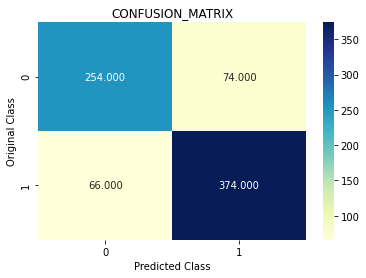

Confusion Matrix of test data


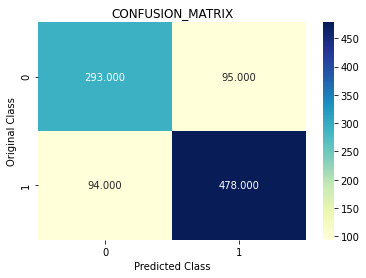

Number of mis-classified points in cv_data: 0.18229166666666666
Number of mis-classified points in test_data: 0.196875
Test_Accuracy : 0.803125


In [202]:
clf = SGDClassifier(alpha=0.001, penalty='l2', loss='hinge', random_state=42)
clf.fit(x_act_train,y_act_train)
sig_clf = CalibratedClassifierCV(clf, method="sigmoid")
sig_clf.fit(x_act_train,y_act_train)
test_probs = sig_clf.predict_proba(xr_test)
print("log loss of test data is :",log_loss(yr_test,test_probs))
print("Classification report for CV data")
print(classification_report(y_act_cv, sig_clf.predict(x_act_cv), labels=[0,1]))
print("Classification report for test data")
print(classification_report(yr_test, sig_clf.predict(xr_test), labels=[0,1]))
print("Confusion Matrix of CV data")
C=confusion_matrix(y_act_cv,sig_clf.predict(x_act_cv))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,sig_clf.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()

print("Number of mis-classified points in cv_data:", np.count_nonzero((sig_clf.predict(x_act_cv) - y_act_cv))/y_act_cv.shape[0])
print("Number of mis-classified points in test_data:", np.count_nonzero((sig_clf.predict(xr_test)-yr_test))/yr_test.shape[0])
print("Test_Accuracy :",sig_clf.score(xr_test,yr_test))
d['Model_Name'].append("Linear SVM")
d['Test_Accuracy'].append(sig_clf.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,test_probs))

# **Decision Tree**

In [203]:
from sklearn.tree import DecisionTreeClassifier
clf = DecisionTreeClassifier()
param_dict = {
    "criterion":['gini','entropy'],
    "max_depth":range(1,10),
    "min_samples_split":range(1,10),
    "min_samples_leaf":range(1,5)
}
grid = GridSearchCV(clf,param_grid=param_dict,cv=5,verbose=1,n_jobs=-1)
grid.fit(xr_train,yr_train)



Fitting 5 folds for each of 648 candidates, totalling 3240 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done 584 tasks      | elapsed:    5.7s
[Parallel(n_jobs=-1)]: Done 2404 tasks      | elapsed:   34.1s
[Parallel(n_jobs=-1)]: Done 3240 out of 3240 | elapsed:   57.3s finished


GridSearchCV(cv=5, error_score=nan,
             estimator=DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features=None,
                                              max_leaf_nodes=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              presort='deprecated',
                                              random_state=None,
                                              splitter='best'),
             iid='deprecated', n_jobs=-1,
             param_grid={'criterion': ['gini', 'entropy'],
                     

In [204]:
grid.best_params_

{'criterion': 'gini',
 'max_depth': 9,
 'min_samples_leaf': 4,
 'min_samples_split': 5}

In [205]:
grid.best_score_

0.9241549190569318

In [206]:
#pd.DataFrame(grid.cv_results_) we can see the results for each parameter combination

In [207]:
clf = DecisionTreeClassifier(criterion='gini',max_depth=9,min_samples_leaf=1,min_samples_split=4)
clf.fit(xr_train,yr_train)

DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=9, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=4,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')

Test_Accuracy :  0.9166666666666666
Test_log_loss :  0.6462023525326744
Confusion Matrix of test data


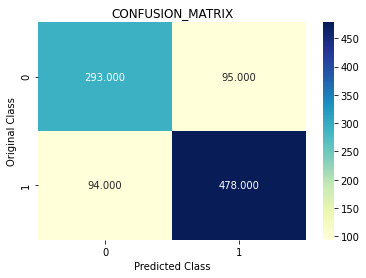

Number of mis-classified points in test_data: 0.196875
Classification_report of test_data
              precision    recall  f1-score   support

           0       0.76      0.76      0.76       388
           1       0.83      0.84      0.83       572

    accuracy                           0.80       960
   macro avg       0.80      0.80      0.80       960
weighted avg       0.80      0.80      0.80       960



In [208]:
print("Test_Accuracy : ",clf.score(xr_test,yr_test))
print("Test_log_loss : ",log_loss(yr_test,clf.predict_proba(xr_test)))
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,sig_clf.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Number of mis-classified points in test_data:", np.count_nonzero((sig_clf.predict(xr_test)-yr_test))/yr_test.shape[0])
print("Classification_report of test_data")
print(classification_report(yr_test, sig_clf.predict(xr_test), labels=[0,1]))
d['Model_Name'].append("Decision Tree")
d['Test_Accuracy'].append(clf.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,clf.predict_proba(xr_test)))

# **Random Forest Classifier**

In [209]:
clf = RandomForestClassifier()
param_dict = {
    "n_estimators":[10,20,25,35,40,50,100,150,200,300],
    'criterion':['gini','entropy']
}
grid = GridSearchCV(clf,param_grid=param_dict,cv=5,n_jobs=-1,verbose=1)
grid.fit(xr_train,yr_train)

Fitting 5 folds for each of 20 candidates, totalling 100 fits


[Parallel(n_jobs=-1)]: Using backend LokyBackend with 2 concurrent workers.
[Parallel(n_jobs=-1)]: Done  64 tasks      | elapsed:   30.5s
[Parallel(n_jobs=-1)]: Done 100 out of 100 | elapsed:  1.2min finished


GridSearchCV(cv=5, error_score=nan,
             estimator=RandomForestClassifier(bootstrap=True, ccp_alpha=0.0,
                                              class_weight=None,
                                              criterion='gini', max_depth=None,
                                              max_features='auto',
                                              max_leaf_nodes=None,
                                              max_samples=None,
                                              min_impurity_decrease=0.0,
                                              min_impurity_split=None,
                                              min_samples_leaf=1,
                                              min_samples_split=2,
                                              min_weight_fraction_leaf=0.0,
                                              n_estimators=100, n_jobs=None,
                                              oob_score=False,
                                              rando

In [210]:
grid.best_params_

{'criterion': 'entropy', 'n_estimators': 150}

In [211]:
grid.best_score_

0.9635121278791828

In [212]:
clf = RandomForestClassifier(n_estimators = grid.best_params_['n_estimators'],criterion='entropy')
clf.fit(xr_train,yr_train)

RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='entropy', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=150,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)

Test_Accuracy :  0.965625
Test_log_loss :  0.13403304007639033
Confusion Matrix of test data


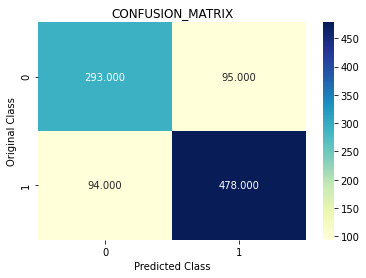

Number of mis-classified points in test_data: 0.196875
Classification_report of test_data
              precision    recall  f1-score   support

           0       0.76      0.76      0.76       388
           1       0.83      0.84      0.83       572

    accuracy                           0.80       960
   macro avg       0.80      0.80      0.80       960
weighted avg       0.80      0.80      0.80       960



In [213]:
print("Test_Accuracy : ",clf.score(xr_test,yr_test))
print("Test_log_loss : ",log_loss(yr_test,clf.predict_proba(xr_test)))
print("Confusion Matrix of test data")
C=confusion_matrix(yr_test,sig_clf.predict(xr_test))
sns.heatmap(C,annot=True,fmt='.3f',cmap="YlGnBu")
plt.title("CONFUSION_MATRIX")
plt.xlabel('Predicted Class')
plt.ylabel('Original Class')
plt.show()
print("Number of mis-classified points in test_data:", np.count_nonzero((sig_clf.predict(xr_test)-yr_test))/yr_test.shape[0])
print("Classification_report of test_data")
print(classification_report(yr_test, sig_clf.predict(xr_test), labels=[0,1]))
d['Model_Name'].append("Random Forest")
d['Test_Accuracy'].append(clf.score(xr_test,yr_test))
d['Test_Log_Loss'].append(log_loss(yr_test,clf.predict_proba(xr_test)))

# **ANN Model**

In [214]:
from keras.models import Sequential
from keras.layers import Dense,Activation
from keras.initializers import RandomNormal
from keras.initializers import he_normal
from keras.layers import Dropout
from keras.layers.normalization import BatchNormalization
input_dim = xr_train.shape[1]#no of cols in our data
batch_size = 128 
nb_epoch = 50

In [215]:
model = Sequential()
model.add(Dense(12,activation='relu',input_shape=(input_dim,),kernel_initializer=he_normal(seed=None)))
# model.add(Dropout(0.5))
model.add(Dense(32,activation='relu',kernel_initializer=he_normal(seed=None)))
# model.add(Dropout(0.5))
model.add(BatchNormalization())
# model.add(Dense(8,activation='relu',kernel_initializer=he_normal(seed=None)))
# model.add(Dropout(0.5))
model.add(Dense(64,activation='relu',kernel_initializer=he_normal(seed=None)))
model.add(BatchNormalization())
model.add(Dense(128,activation='relu',kernel_initializer=he_normal(seed=None)))
model.add(BatchNormalization())
model.add(Dense(4,activation='sigmoid',kernel_initializer=RandomNormal(mean=0.0, stddev=0.05, seed=None)))
model.add(BatchNormalization())
model.add(Dense(1, activation='sigmoid'))

model.summary()



Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense (Dense)                (None, 12)                204       
_________________________________________________________________
dense_1 (Dense)              (None, 32)                416       
_________________________________________________________________
batch_normalization (BatchNo (None, 32)                128       
_________________________________________________________________
dense_2 (Dense)              (None, 64)                2112      
_________________________________________________________________
batch_normalization_1 (Batch (None, 64)                256       
_________________________________________________________________
dense_3 (Dense)              (None, 128)               8320      
_________________________________________________________________
batch_normalization_2 (Batch (None, 128)               5

In [216]:
model.compile(optimizer='RMSprop', loss='categorical_crossentropy', metrics=['accuracy'])


In [217]:
history = model.fit(xr_train, yr_train, batch_size=batch_size, epochs=nb_epoch, verbose=1, validation_data=(xr_test, yr_test))

Epoch 1/50
30/30 [==============================] - 3s 29ms/step - loss: 0.0000e+00 - accuracy: 0.6664 - val_loss: 0.0000e+00 - val_accuracy: 0.5958
Epoch 2/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.7839 - val_loss: 0.0000e+00 - val_accuracy: 0.5958
Epoch 3/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.8210 - val_loss: 0.0000e+00 - val_accuracy: 0.6677
Epoch 4/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.8333 - val_loss: 0.0000e+00 - val_accuracy: 0.7688
Epoch 5/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.8576 - val_loss: 0.0000e+00 - val_accuracy: 0.8177
Epoch 6/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.8541 - val_loss: 0.0000e+00 - val_accuracy: 0.8458
Epoch 7/50
30/30 [==============================] - 0s 5ms/step - loss: 0.0000e+00 - accuracy: 0.8725 - val_los

In [218]:
score = model.evaluate(xr_test,yr_test)
print(score)

30/30 [==============================] - 0s 2ms/step - loss: 0.0000e+00 - accuracy: 0.9187
[0.0, 0.918749988079071]


In [219]:
print("Test_Accuracy is : ",score[1])

Test_Accuracy is :  0.918749988079071


In [220]:
print("Log_loss on Test_data is : ",log_loss(yr_test,model.predict_proba(xr_test)))

Log_loss on Test_data is :  0.9107760160772326


In [221]:
d['Model_Name'].append("ANN")
d['Test_Accuracy'].append(score[1])
d['Test_Log_Loss'].append(log_loss(yr_test,model.predict_proba(xr_test)))

In [222]:
pd.DataFrame(d)

,Model_Name,Test_Accuracy,Test_Log_Loss
0,Gaussian NB,0.771875,0.592882
1,Logistic Regression,0.800000,0.478063
2,KNN,0.971875,0.075003
3,Linear SVM,0.803125,0.477721
4,Decision Tree,0.916667,0.646202
5,Random Forest,0.965625,0.134033
6,ANN,0.918750,0.910776


In [223]:
import pickle

In [224]:
with open("telecom_churn_model",'wb') as f:
    pickle.dump(knn_sig_clf,f)
with open("telecom_churn_model",'rb') as f:
    model = pickle.load(f)
model.score(xr_test,yr_test)

0.971875

In [225]:
import numpy as np
x = np.array([[0,1,1.237526,0.475169,1.581853,-0.055074,-0.071442,-0.466079,0.865760,-0.603593,-0.088627,-0.427687,0.777468,-0.141274,0.840839,0.108964]])

In [226]:
model.predict(x)

array([0])